In [27]:
import sys
import numpy as np
import pandas as pd
import sklearn
import pickle
import operator
import time
import itertools
from scipy import sparse
from functools import partial
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt

sys.path.insert(0, '../classifiers/')
from ExplainableClassifier import ExplainableClassifier
from ExplainableLSTM import ExplainableLSTM
from ExplainableSVM import ExplainableSVM
from ExplainableNaiveBayes import ExplainableNaiveBayes
from ExplainableAttentionLSTM import ExplainableAttentionLSTM

### 20ng

In [28]:
glove_ng = ExplainableLSTM.load_glove_wordvectors('../wordvectors/glove.6B.50d.txt')

Load word embeddings
Word embeddings loaded.


In [29]:
svm_ng = ExplainableSVM.import_model('../trained_models/svm_ng/')
lstm_ng = ExplainableLSTM.import_model('../trained_models/lstm_ng/', glove_ng)
naive_ng = ExplainableNaiveBayes.import_model('../trained_models/naive_ng/')
att_lstm_ng = ExplainableAttentionLSTM.import_model('../trained_models/att_lstm_ng/', glove_ng)

In [30]:
data_ng_test = sklearn.datasets.fetch_20newsgroups(subset='test')
X_ng_test = np.array([text.partition('\n\n')[2] for text in data_ng_test.data])
y_ng_test = np.array(data_ng_test.target)
del data_ng_test

### Toxic Comments

In [3]:
glove_tc = ExplainableLSTM.load_glove_wordvectors('../wordvectors/tc_custom_trained_vectors.txt')

Load word embeddings
Word embeddings loaded.


In [4]:
svm_tc = ExplainableSVM.import_model('../trained_models/svm_tc/')
lstm_tc = ExplainableLSTM.import_model('../trained_models/lstm_tc/', glove_tc)
naive_tc = ExplainableNaiveBayes.import_model('../trained_models/naive_tc/')
att_lstm_tc = ExplainableAttentionLSTM.import_model('../trained_models/att_lstm_tc/', glove_tc)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.


In [8]:
data_tc_test = pd.read_csv('../datasets/toxic_comments/test_custom.csv')
data_tc_test[data_tc_test.toxic == 1]

X_tc_test = data_tc_test.comment_text.to_numpy()
y_tc_test = data_tc_test[['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']].to_numpy()

del data_tc_test

In [6]:
y_tc_test.sum(axis=0)

array([2149,  205, 1218,   72, 1126,  211])

In [9]:
# Balance Classes

data_tc_test = pd.read_csv('../datasets/toxic_comments/test_custom.csv')
num_toxic_comments = 2149
data_tc_test = data_tc_test.sample(frac=1.0).reset_index()
data_tc_test_balanced = pd.concat([data_tc_test[data_tc_test.toxic == 1][:num_toxic_comments], data_tc_test[data_tc_test.toxic == 0][:num_toxic_comments]], axis=0).sample(frac=1.).reset_index()
X_tc_test = data_tc_test_balanced.comment_text.to_numpy()
y_tc_test = data_tc_test_balanced[['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']].to_numpy()

del data_tc_test_balanced, data_tc_test

In [52]:
# Only toxic

data_tc_test = pd.read_csv('../datasets/toxic_comments/test_custom.csv')
num_toxic_comments = 4000
data_tc_test_toxic_only = data_tc_test[data_tc_test.toxic == 1][:num_toxic_comments]
X_tc_test = data_tc_test_toxic_only.comment_text.to_numpy()
y_tc_test = data_tc_test_toxic_only[['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']].to_numpy()

## Utitlity Functions

In [31]:
def unit_norm(x):
    norm = np.linalg.norm(x)
    if norm == 0:
        return x
    return x / np.linalg.norm(x)

# EPI

In [32]:
def relu(x, c=1):
    return (x * (x>0)) * c
def exp(x, base=np.e):
    return np.power(base, x)

In [33]:
def doc_summary_vector_lstm(x, lstm, explain, func = None):
    word_vectors = lstm._word_vectors(lstm.preprocess_text(x))[0]
    explanation = explain(x)[0]
    if func is not None:
        explanation = func(explanation)
    extended_explanation = np.repeat(explanation[:,np.newaxis], lstm.wordvector_dimension, 1)
    summ_vec = word_vectors * extended_explanation
    summ_vec = summ_vec.sum(axis=0)
    return unit_norm(summ_vec)

def doc_summary_vector_svm(x, svm, explain, func = None):
    tfidf_vec = svm.tfidf_vectorizer.transform([x]).toarray()[0]
    voc = svm.tfidf_vectorizer.vocabulary_
    explanation = explain(x)[0]
    if func is not None:
        explanation = func(explanation)
    summ_vec = tfidf_vec * explanation
    return unit_norm(summ_vec)

def doc_summary_vector_tfidf(x, svm):
    tfidf_vec = svm.tfidf_vectorizer.transform([x]).toarray()[0]
    return unit_norm(tfidf_vec)

def doc_summary_vector_wordvectors(x, lstm):
    word_vectors = lstm._word_vectors(lstm.preprocess_text(x))[0]
    summ_vec = word_vectors.sum(axis=0)
    return unit_norm(summ_vec)

def doc_summary_vector_naive(x, naive):
    explanation = naive._explain(x)[0]
    bow = naive.bow_vector(x)
    summ_vec = explanation * bow
    return unit_norm(summ_vec)

In [34]:
def generate_dsvs(data, dsv_function):
    dsv_dimension = dsv_function(data[0]).shape[0]
    dsvs = np.zeros((len(data), dsv_dimension))
    for i in range(len(data)):
        dsvs[i] = dsv_function(data[i])
    return dsvs

In [35]:
def scatter_plot_doc_summary_vectors(dsv, pred, label_mapping, dim_reduction=TSNE(n_components=2), title='Document Summary Vectors', save=None):
    
    dsv_small = dim_reduction.fit_transform(np.array(dsv))

    fig = plt.figure(figsize=[10,10], dpi=300)
    ax = fig.add_subplot(1, 1, 1)
    ax.set_axis_off()
    colors = np.array(pred) / 20
    labels = np.array(label_mapping)[pred]

    if pred.max() == 1:
        ax.scatter(dsv_small[:,0], dsv_small[:,1], marker='x', c=colors, cmap='bwr', label=labels)
    else:
        ax.scatter(dsv_small[:,0], dsv_small[:,1], marker='x', c=colors, cmap='gist_rainbow', label=labels)

    plt.title(title)
    # plt.legend(loc=2)
    plt.axis("off")
    if save is not None:
        plt.savefig(save)
    plt.show()

In [36]:
def knn_accuracy(dsvs, pred, k, iterations=10):
    acc_score = np.zeros(iterations)
    for i in range(iterations):
        dsvs, pred = shuffle_data(dsvs, pred)
        split = pred.shape[0] // 2
        knn_clf = KNeighborsClassifier(n_neighbors=k)
        knn_clf.fit(dsvs[:split], pred[:split])
        acc_score[i] = knn_clf.score(dsvs[split:], pred[split:])
    return acc_score.mean()

In [37]:
def shuffle_data(X, y):
    p = np.random.permutation(X.shape[0])
    return X[p], y[p]

In [38]:
def sample_data(X, y, size):
    if size > len(X):
        size = len(X)
    random_indices = np.random.choice(len(X), size, replace=False)
    return X[random_indices], y[random_indices]

In [39]:
X_sampled, y_sampled = X_ng_test, y_ng_test

## LSTM - EPI - NG

In [40]:
lstm_pred = lstm_ng.predict(X_sampled)[:,0]

In [41]:
%time dsvs_wordvectors = generate_dsvs(X_sampled, partial(doc_summary_vector_wordvectors, lstm=lstm_ng))

CPU times: user 34.7 s, sys: 0 ns, total: 34.7 s
Wall time: 34.8 s


In [43]:
scatter_plot_doc_summary_vectors(dsvs_wordvectors, lstm_pred, lstm_ng.label_mapping[0], title='', save='./epi_lstm_ng_wordvectors.png')

In [71]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 5)

0.4400690387679235

In [72]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 7)

0.44973446627721714

In [73]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 9)

0.45246946362187995

In [74]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 11)

0.45616038236856077

In [75]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 13)

0.45724907063197034

In [76]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 15)

0.45727562400424854

In [77]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 17)

0.4574614976101964

In [78]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 19)

0.4623207647371216

In [79]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 21)

0.4574083908656399

In [41]:
explain_lrp = partial(lstm_ng.explain, method='lrp', domain_mapping=False)

In [42]:
%time dsvs_lstm_lrp = generate_dsvs(X_sampled, partial(doc_summary_vector_lstm, lstm=lstm_ng, explain=explain_lrp))

CPU times: user 2h 21min 37s, sys: 2h 15min 27s, total: 4h 37min 4s
Wall time: 53min 51s


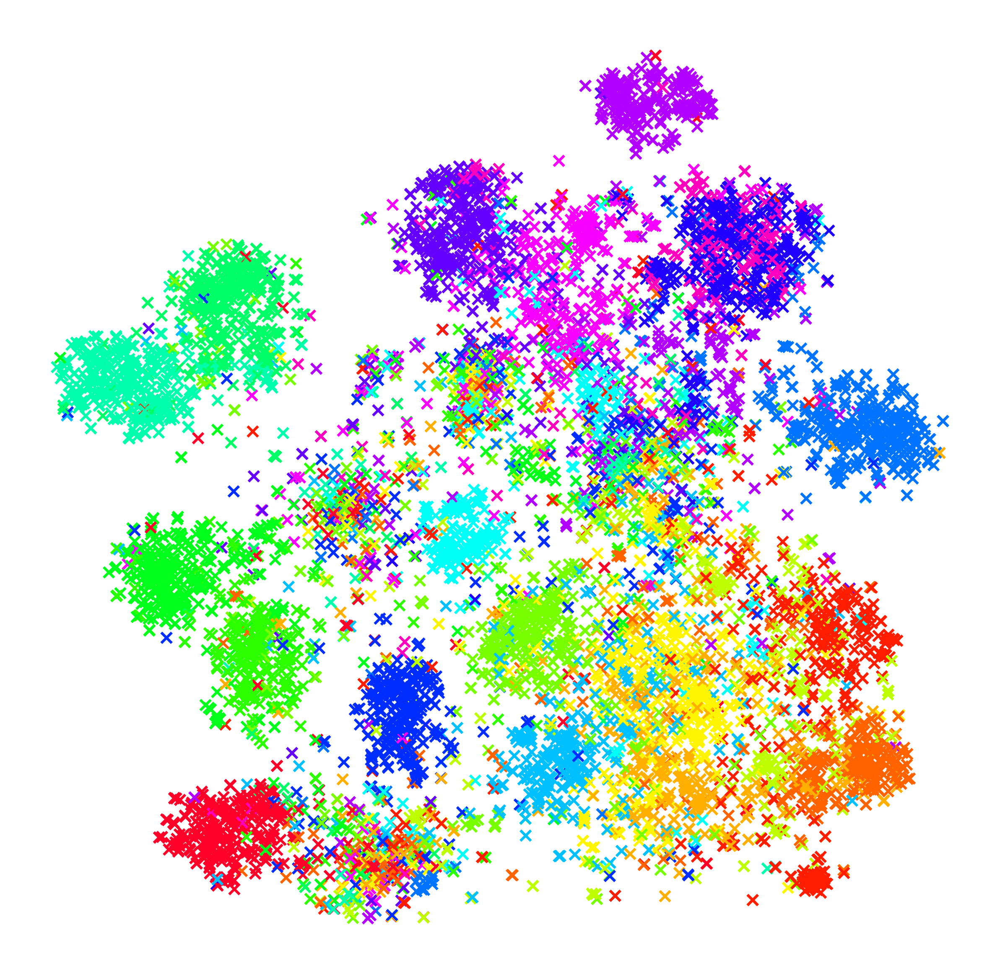

In [44]:
scatter_plot_doc_summary_vectors(dsvs_lstm_lrp, lstm_pred, lstm_ng.label_mapping[0], title='', save='./epi_lstm_ng_lrp.png')

In [81]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 1)

0.6595326606479023

In [82]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 3)

0.6614445034519385

In [83]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 5)

0.6696229421136486

In [84]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 7)

0.6689856611789697

In [85]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 9)

0.6690387679235263

In [99]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 10)

0.6684545937334041

In [86]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 11)

0.6720658523632501

In [100]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 12)

0.6673659054699947

In [87]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 13)

0.6667551779075942

In [88]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 15)

0.666250663834307

In [89]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 17)

0.6597981943706851

In [62]:
lstm_explain_lime = partial(lstm_ng._explain_instance_lime, domain_mapping=False, sample_size=3000)

In [63]:
%time dsvs_lstm_lime = generate_dsvs(X_sampled, partial(doc_summary_vector_lstm, lstm=lstm_ng, explain=lstm_explain_lime))

CPU times: user 2d 2h 34min 19s, sys: 4h 39min 36s, total: 2d 7h 13min 55s
Wall time: 14h 2s


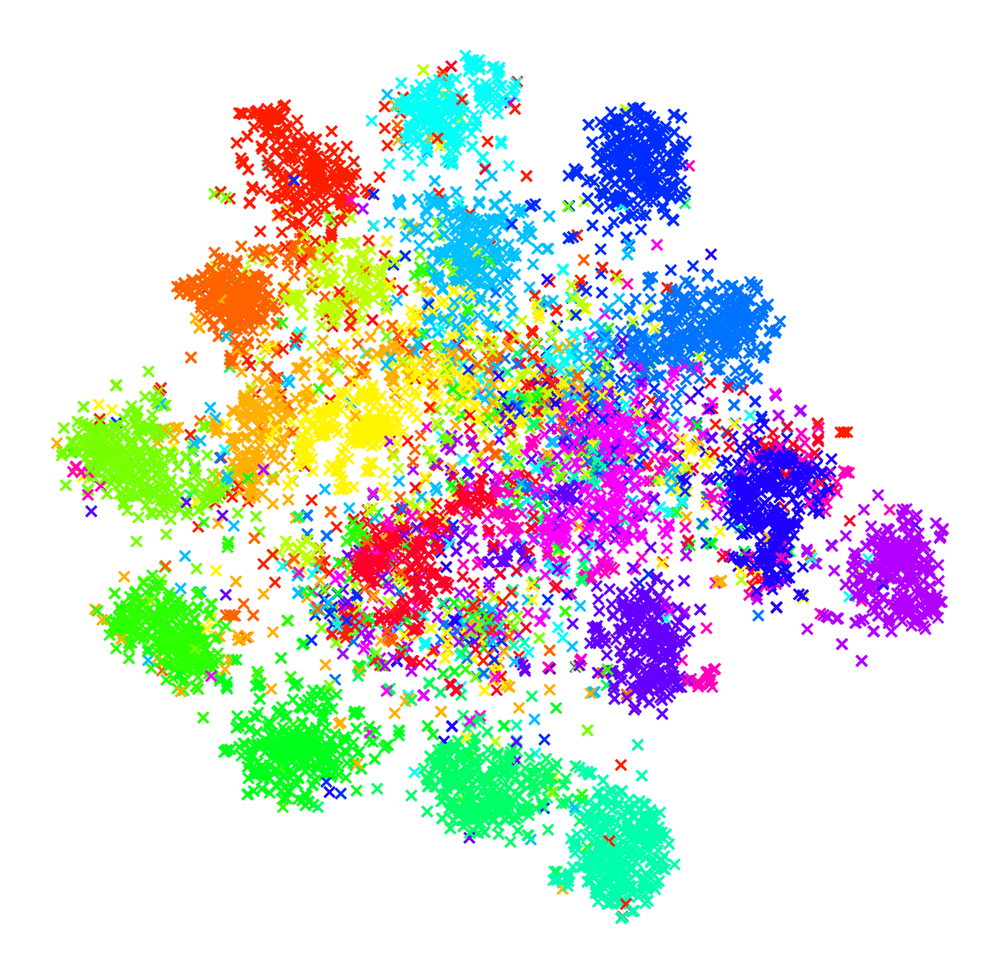

In [65]:
scatter_plot_doc_summary_vectors(dsvs_lstm_lime, lstm_pred, lstm_ng.label_mapping[0], title='', save='./epi_lstm_ng_lime.png')

In [97]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 1)

0.747052575677111

In [98]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 3)

0.7509293680297398

In [91]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 5)

0.7558948486457779

In [101]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 6)

0.7535581518852894

In [92]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 7)

0.756080722251726

In [102]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 8)

0.7516994158258099

In [93]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 9)

0.7529208709506107

In [94]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 11)

0.7471322357939458

In [95]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 13)

0.7404407859798194

In [96]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 15)

0.7373871481678173

## SVM - EPI - NG

In [15]:
svm_pred = svm_ng.predict(X_sampled)[:,0]

In [73]:
dsvs_tfidf = generate_dsvs(X_sampled, partial(doc_summary_vector_tfidf, svm=svm_ng))

In [47]:
dsvs_tfidf_sparse = sparse.csr_matrix(dsvs_tfidf)

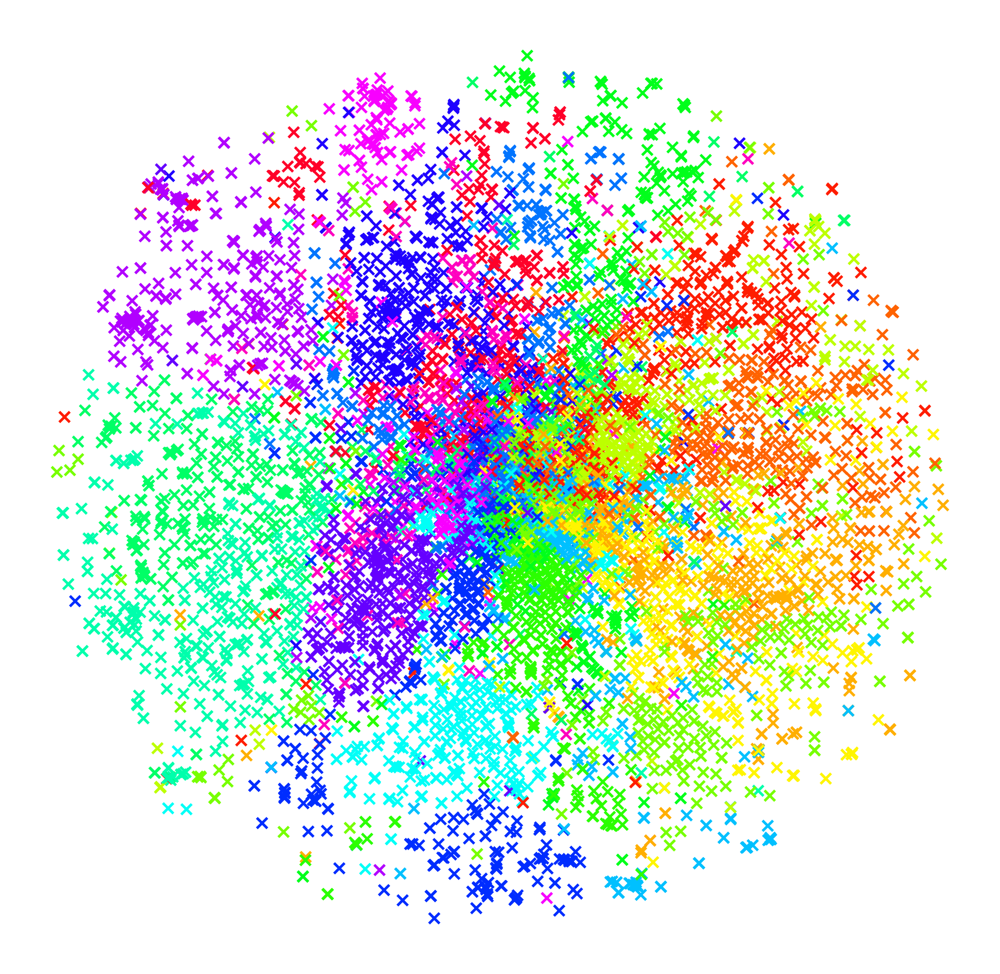

CPU times: user 1h 19min 44s, sys: 1.7 s, total: 1h 19min 46s
Wall time: 1h 19min 59s


In [20]:
%time scatter_plot_doc_summary_vectors(dsvs_tfidf, svm_pred, lstm_ng.label_mapping[0], title='', save='./epi_svm_ng_tfidf.png')

In [58]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 1)

CPU times: user 8.51 s, sys: 2.65 ms, total: 8.51 s
Wall time: 8.53 s


0.3728359001593203

In [59]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 3)

CPU times: user 8.75 s, sys: 0 ns, total: 8.75 s
Wall time: 8.76 s


0.1893255443441317

In [60]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 5)

CPU times: user 9.27 s, sys: 0 ns, total: 9.27 s
Wall time: 9.27 s


0.11898566117896973

In [61]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 7)

CPU times: user 9.38 s, sys: 0 ns, total: 9.38 s
Wall time: 9.39 s


0.09158258098778545

In [62]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 9)

CPU times: user 9.42 s, sys: 0 ns, total: 9.42 s
Wall time: 9.43 s


0.07668613913967073

In [63]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 11)

CPU times: user 9.34 s, sys: 0 ns, total: 9.34 s
Wall time: 9.35 s


0.0906001062134891

In [64]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 13)

CPU times: user 9.52 s, sys: 0 ns, total: 9.52 s
Wall time: 9.53 s


0.13759957514604354

In [65]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 15)

CPU times: user 9.6 s, sys: 0 ns, total: 9.6 s
Wall time: 9.62 s


0.13398831651619755

In [66]:
%time knn_accuracy(dsvs_tfidf_sparse, svm_pred, 17)

CPU times: user 9.9 s, sys: 0 ns, total: 9.9 s
Wall time: 9.91 s


0.11001062134891133

In [43]:
explain_lrp = partial(svm_ng._explain_instance_lrp, domain_mapping=False)
%time dsvs_svm_lrp = generate_dsvs(X_sampled, partial(doc_summary_vector_svm, svm=svm_ng, explain=explain_lrp))

CPU times: user 20min 26s, sys: 26min 22s, total: 46min 48s
Wall time: 6min 25s


In [41]:
dsvs_svm_lrp_sparse = sparse.csr_matrix(dsvs_svm_lrp)

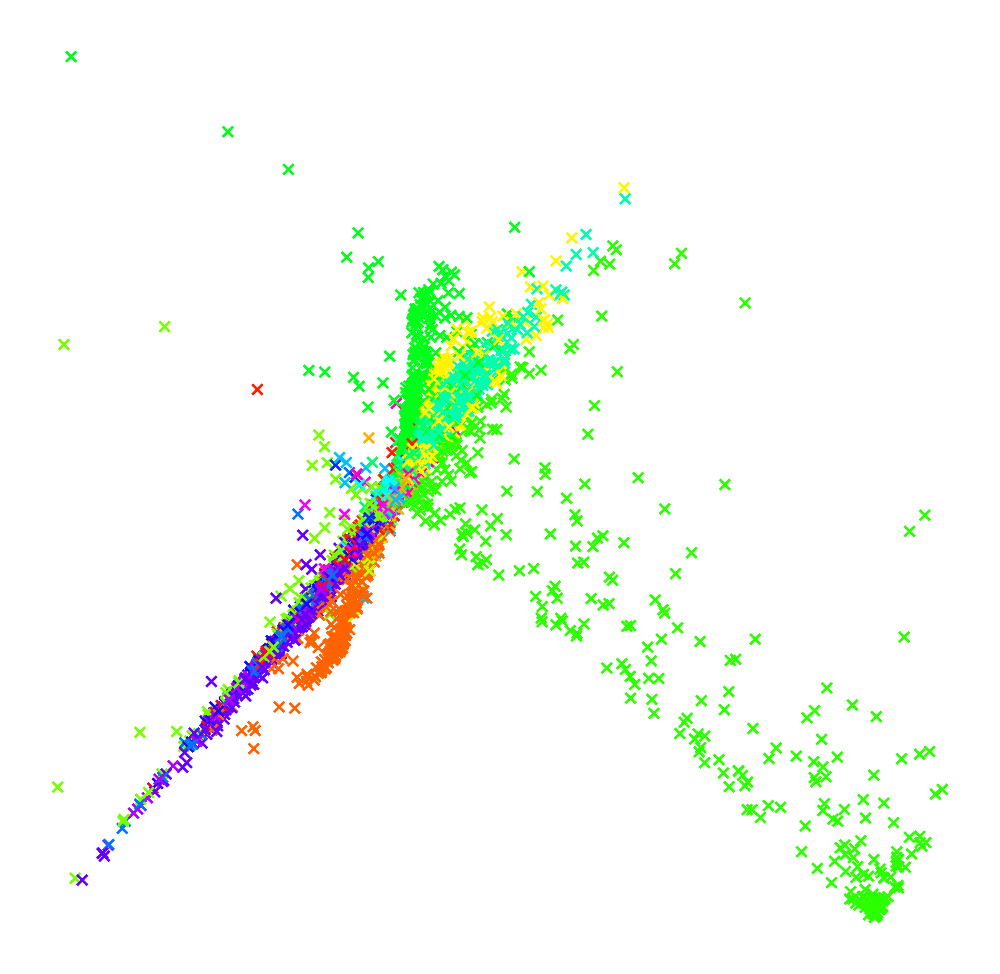

In [24]:
scatter_plot_doc_summary_vectors(dsvs_svm_lrp, svm_pred, lstm_ng.label_mapping[0], title='', save='./epi_svm_ng_lrp_pca.png')

In [43]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 1)

CPU times: user 8.65 s, sys: 1.13 s, total: 9.79 s
Wall time: 9.81 s


0.758364312267658

In [44]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 3)

CPU times: user 8.86 s, sys: 1.06 s, total: 9.92 s
Wall time: 9.93 s


0.6464152947424323

In [45]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 5)

CPU times: user 9.74 s, sys: 1.02 s, total: 10.8 s
Wall time: 10.8 s


0.5680562931492299

In [46]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 7)

CPU times: user 9.48 s, sys: 1.06 s, total: 10.5 s
Wall time: 10.5 s


0.5185873605947956

In [47]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 9)

CPU times: user 9.57 s, sys: 1.05 s, total: 10.6 s
Wall time: 10.6 s


0.4656664896441849

In [48]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 11)

CPU times: user 9.61 s, sys: 1.01 s, total: 10.6 s
Wall time: 10.6 s


0.4360594795539033

In [49]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 13)

CPU times: user 9.68 s, sys: 1.02 s, total: 10.7 s
Wall time: 10.7 s


0.5376792352628784

In [50]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 15)

CPU times: user 9.63 s, sys: 1.09 s, total: 10.7 s
Wall time: 10.7 s


0.5371747211895912

In [51]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 17)

CPU times: user 9.64 s, sys: 1.03 s, total: 10.7 s
Wall time: 10.7 s


0.591157727031333

In [52]:
%time knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 19)

CPU times: user 9.81 s, sys: 959 ms, total: 10.8 s
Wall time: 10.8 s


0.5819702602230483

In [33]:
explain_lime = partial(svm_ng._explain_instance_lime, domain_mapping=False)
%time dsvs_svm_lime = generate_dsvs(X_sampled, partial(doc_summary_vector_svm, svm=svm_ng, explain=explain_lime))

CPU times: user 6h 9s, sys: 1h 37min 28s, total: 7h 37min 38s
Wall time: 5h 5min 35s


In [21]:
dsvs_svm_lime_sparse = sparse.csr_matrix(dsvs_svm_lime)

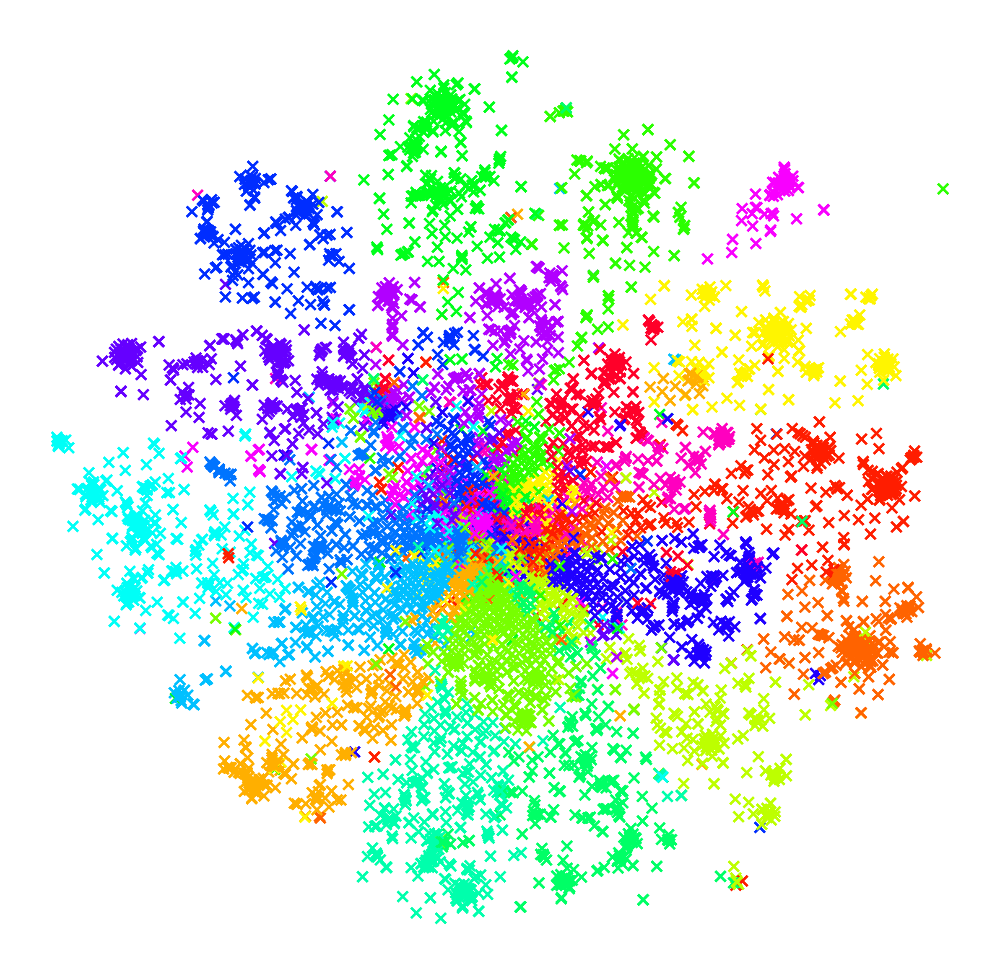

In [22]:
scatter_plot_doc_summary_vectors(dsvs_svm_lime, svm_pred, lstm_ng.label_mapping[0], title='', save='./epi_svm_ng_lime.png')

In [29]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 1)

CPU times: user 8.74 s, sys: 1.05 s, total: 9.78 s
Wall time: 10 s


0.681067445565587

In [39]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 2)

CPU times: user 8.73 s, sys: 1.05 s, total: 9.77 s
Wall time: 9.79 s


0.5962559745087626

In [30]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 3)

CPU times: user 8.94 s, sys: 1.02 s, total: 9.95 s
Wall time: 9.98 s


0.56064790228359

In [31]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 5)

CPU times: user 9.46 s, sys: 1.03 s, total: 10.5 s
Wall time: 10.5 s


0.48977695167286245

In [32]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 7)

CPU times: user 9.67 s, sys: 961 ms, total: 10.6 s
Wall time: 10.7 s


0.4458311205523101

In [33]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 9)

CPU times: user 9.59 s, sys: 1.04 s, total: 10.6 s
Wall time: 10.6 s


0.40507169410515137

In [34]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 11)

CPU times: user 9.64 s, sys: 998 ms, total: 10.6 s
Wall time: 10.7 s


0.40605416887944773

In [35]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 13)

CPU times: user 9.56 s, sys: 1.06 s, total: 10.6 s
Wall time: 10.6 s


0.402283590015932

In [36]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 15)

CPU times: user 9.61 s, sys: 968 ms, total: 10.6 s
Wall time: 10.6 s


0.5594795539033457

In [37]:
%time knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 17)

CPU times: user 9.66 s, sys: 1.05 s, total: 10.7 s
Wall time: 10.7 s


0.43181093998937864

## Attention LSTM - EPI - NG

In [52]:
att_lstm_pred = att_lstm_ng.predict(X_sampled)[:,0]

In [23]:
%time dsvs_att_lstm = generate_dsvs(X_sampled, partial(doc_summary_vector_lstm, lstm=att_lstm_ng, explain=att_lstm_ng._explain))

CPU times: user 17min 46s, sys: 3min 46s, total: 21min 33s
Wall time: 4min 54s


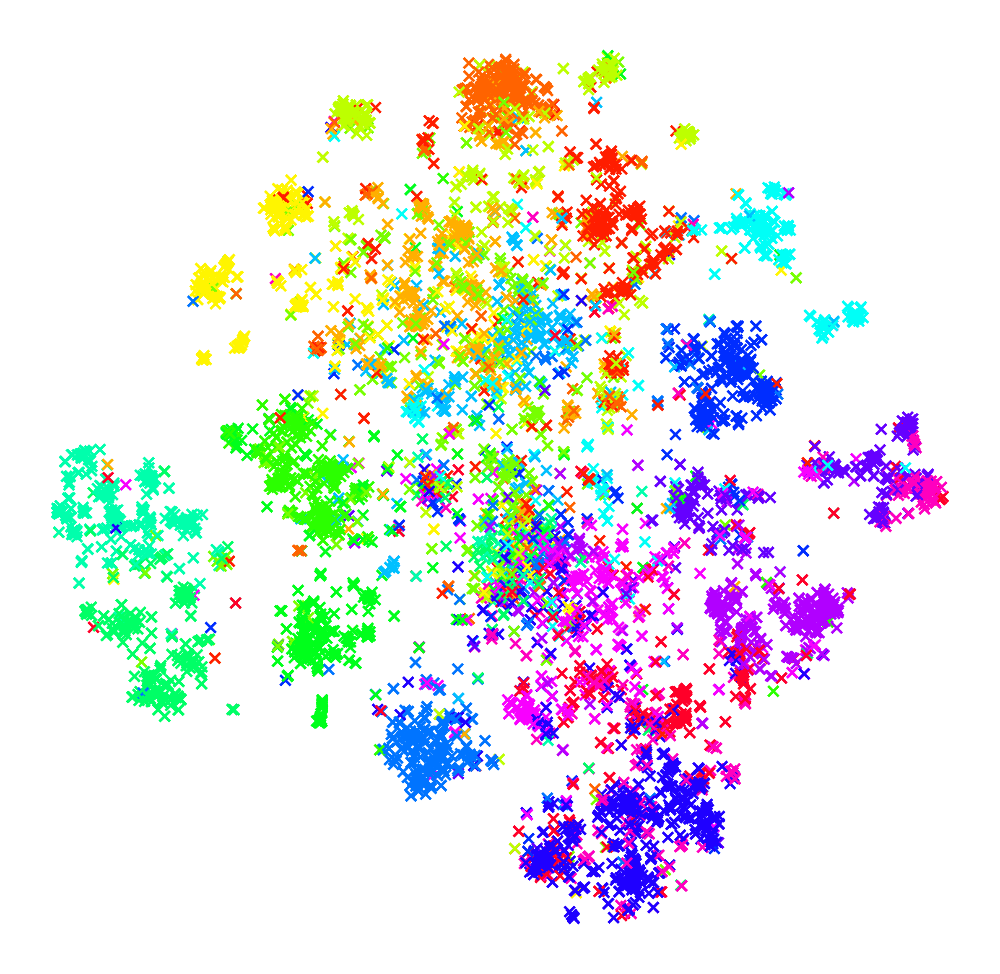

In [25]:
scatter_plot_doc_summary_vectors(dsvs_att_lstm, att_lstm_pred, lstm_ng.label_mapping[0], title='', save='./epi_att_lstm_ng.png')

In [35]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 1)

0.6932023366967605

In [36]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 2)

0.6727562400424854

In [37]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 3)

0.6934147636749868

In [44]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 4)

0.6921667551779077

In [38]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 5)

0.7011152416356877

In [45]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 6)

0.6975570897503983

In [39]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 7)

0.6998672331386087

In [40]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 9)

0.6979819437068507

In [41]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 11)

0.6998672331386087

In [42]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 13)

0.6943972384492831

In [43]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 15)

0.6988050982474775

## Naive Bayes - EPI - NG

In [66]:
naive_pred = naive_ng.predict(X_sampled)[:,0]

In [19]:
%time dsvs_naive = generate_dsvs(X_sampled, partial(doc_summary_vector_naive, naive=naive_ng))

CPU times: user 23min 38s, sys: 28min 53s, total: 52min 31s
Wall time: 6min 59s


In [21]:
dsvs_naive_sparse = sparse.csr_matrix(dsvs_naive)

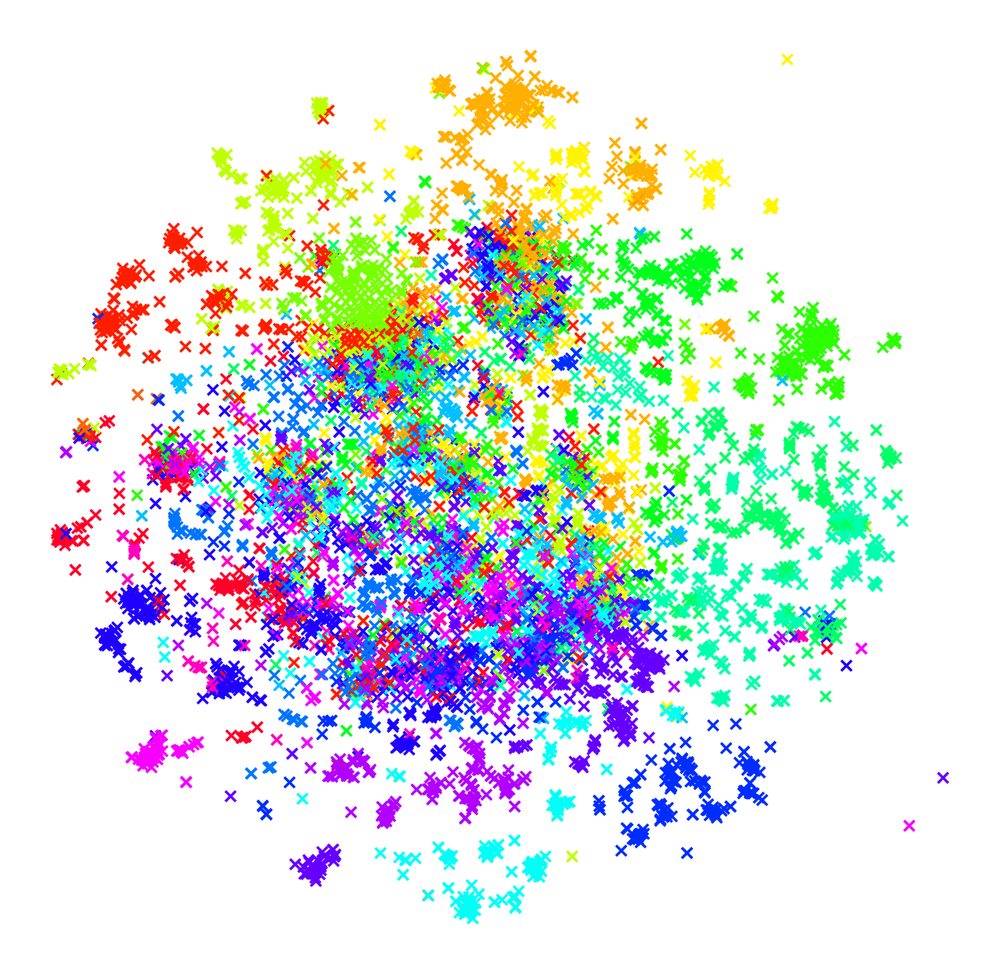

In [22]:
scatter_plot_doc_summary_vectors(dsvs_naive, naive_pred, lstm_ng.label_mapping[0], title='', save='./epi_naive_ng.png')

In [23]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 1)

CPU times: user 8.47 s, sys: 48.9 ms, total: 8.52 s
Wall time: 8.49 s


0.6046202867764207

In [24]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 2)

CPU times: user 8.51 s, sys: 0 ns, total: 8.51 s
Wall time: 8.52 s


0.5653212958045672

In [25]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 3)

CPU times: user 8.62 s, sys: 0 ns, total: 8.62 s
Wall time: 8.63 s


0.543335103558152

In [26]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 5)

CPU times: user 9.3 s, sys: 8.13 ms, total: 9.31 s
Wall time: 9.32 s


0.5071959638874136

In [27]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 7)

CPU times: user 9.41 s, sys: 0 ns, total: 9.41 s
Wall time: 9.42 s


0.47663303239511423

In [28]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 9)

CPU times: user 9.43 s, sys: 0 ns, total: 9.43 s
Wall time: 9.45 s


0.4601433882103027

In [29]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 11)

CPU times: user 9.35 s, sys: 496 µs, total: 9.35 s
Wall time: 9.36 s


0.425570897503983

In [30]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 13)

CPU times: user 9.47 s, sys: 1.77 ms, total: 9.47 s
Wall time: 9.48 s


0.42251725969198095

In [31]:
%time knn_accuracy(dsvs_naive_sparse, naive_pred, 15)

CPU times: user 9.41 s, sys: 0 ns, total: 9.41 s
Wall time: 9.42 s


0.4388210302708444

---


----



----

In [53]:
X_sampled, y_sampled = X_tc_test, y_tc_test

## LSTM - EPI - TC

In [17]:
lstm_pred = lstm_tc.predict(X_sampled)[:,0]

In [18]:
%time dsvs_wordvectors = generate_dsvs(X_sampled, partial(doc_summary_vector_wordvectors, lstm=lstm_tc))

CPU times: user 2.67 s, sys: 0 ns, total: 2.67 s
Wall time: 2.68 s


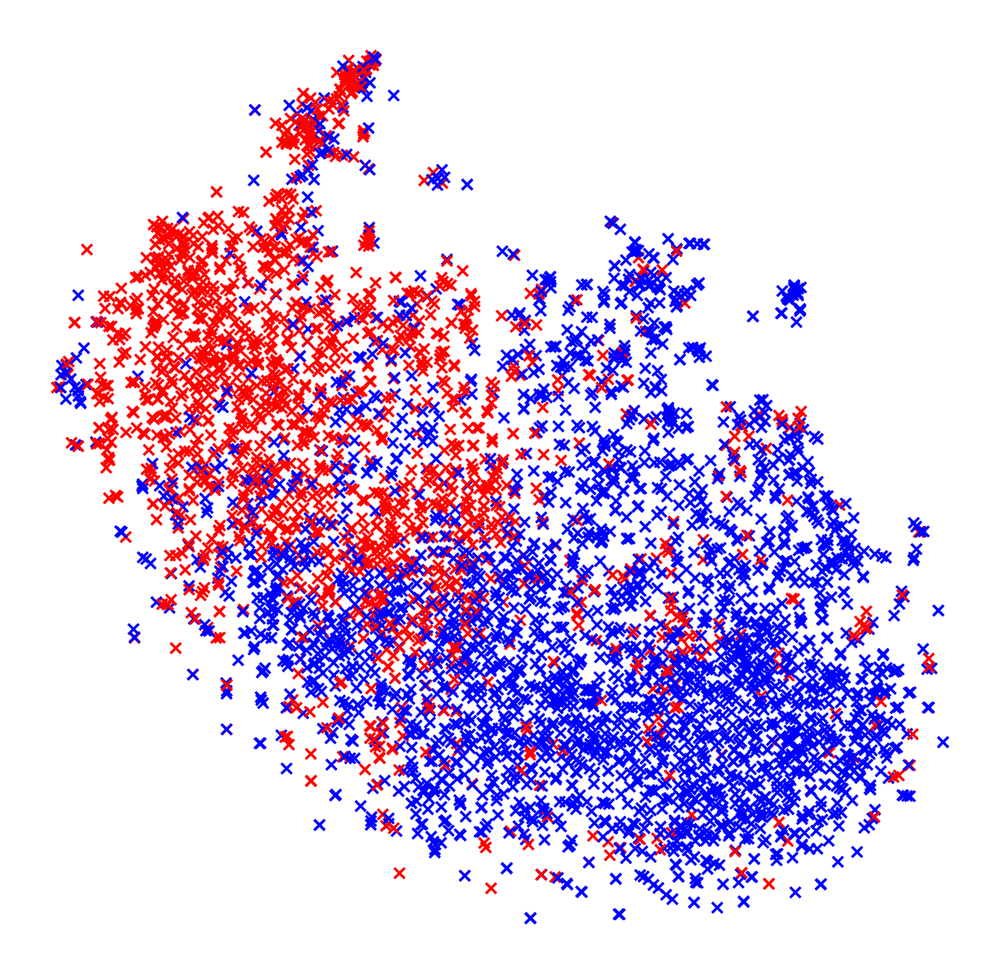

In [83]:
scatter_plot_doc_summary_vectors(dsvs_wordvectors, lstm_pred, lstm_tc.label_mapping[0], title='', save='./epi_lstm_tc_wordvectors.png')

In [19]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 3)

0.8239646347138205

In [20]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 5)

0.8373662168450442

In [21]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 7)

0.8409027454630061

In [22]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 9)

0.8419730107026524

In [23]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 11)

0.8470916705444391

In [24]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 13)

0.8423452768729641

In [25]:
knn_accuracy(dsvs_wordvectors, lstm_pred, 15)

0.8473708701721732

In [26]:
explain_lrp = partial(lstm_tc._explain_instance_lrp, domain_mapping=False)
%time dsvs_lstm_lrp = generate_dsvs(X_sampled, partial(doc_summary_vector_lstm, lstm=lstm_tc, explain=explain_lrp))

CPU times: user 51min 3s, sys: 54min 50s, total: 1h 45min 54s
Wall time: 16min 55s


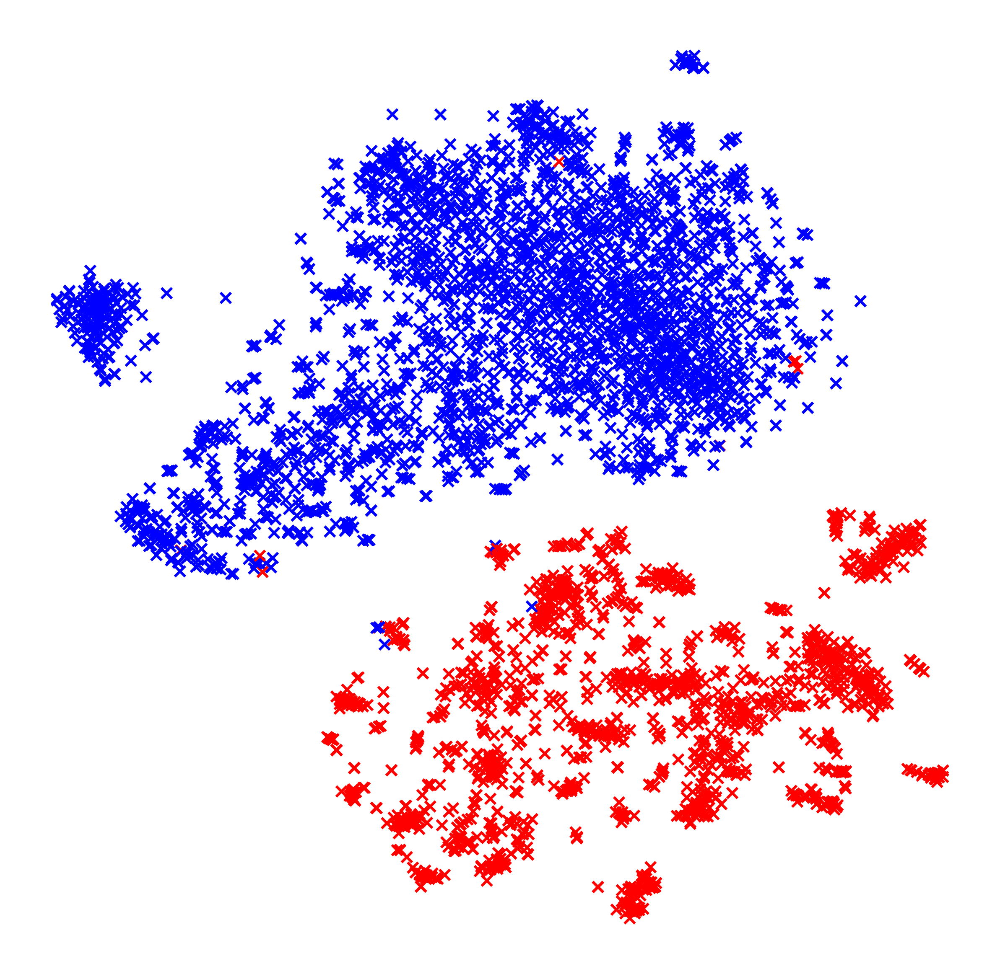

In [27]:
scatter_plot_doc_summary_vectors(dsvs_lstm_lrp, lstm_pred, lstm_tc.label_mapping[0], title='', save='./epi_lstm_tc_lrp.png')

In [28]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 3)

0.9966961377384832

In [29]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 5)

0.9962773382968824

In [30]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 13)

0.9954397394136807

In [31]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 9)

0.9965100046533273

In [32]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 7)

0.9962773382968824

In [33]:
knn_accuracy(dsvs_lstm_lrp, lstm_pred, 11)

0.9953932061423918

In [34]:
lstm_explain_lime = partial(lstm_tc._explain_instance_lime, domain_mapping=False, sample_size=3000)
%time dsvs_lstm_lime = generate_dsvs(X_sampled, partial(doc_summary_vector_lstm, lstm=lstm_tc, explain=lstm_explain_lime))

CPU times: user 14h 34min 14s, sys: 1h 50min 48s, total: 16h 25min 3s
Wall time: 3h 48min 16s


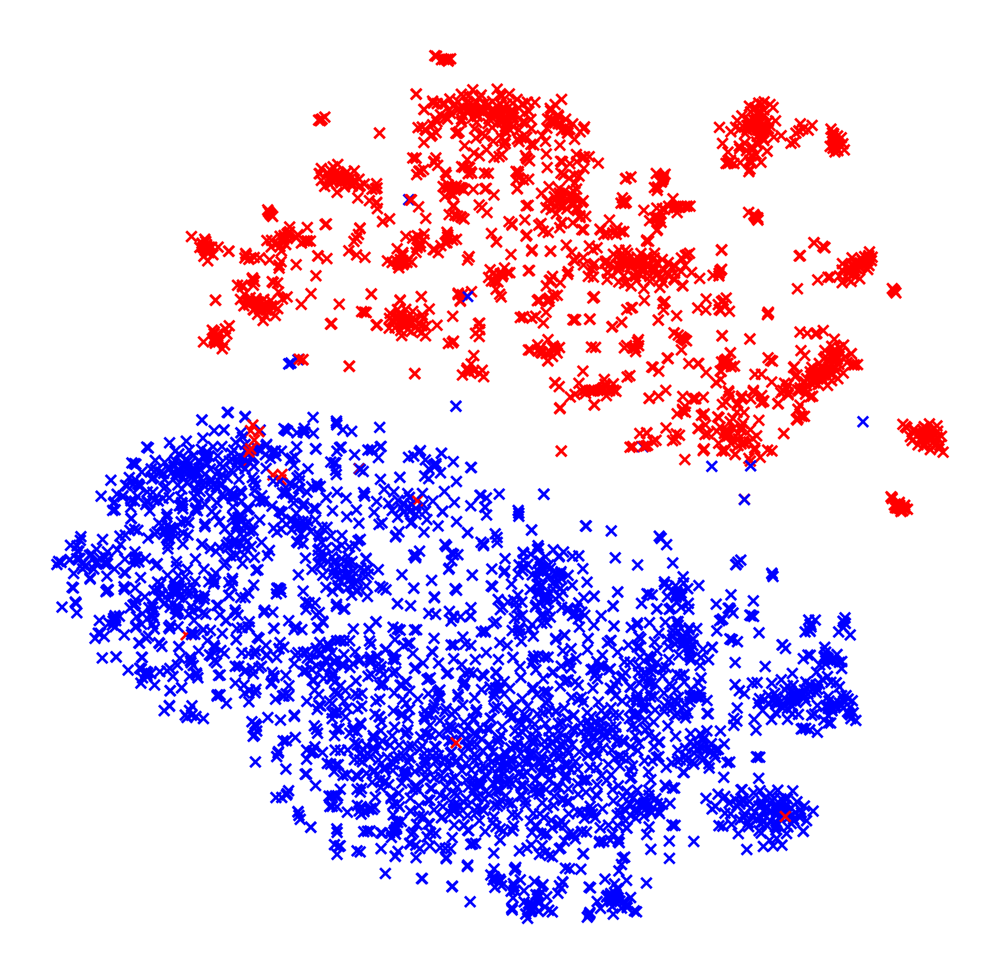

In [35]:
scatter_plot_doc_summary_vectors(dsvs_lstm_lime, lstm_pred, lstm_tc.label_mapping[0], title='', save='./epi_lstm_tc_lime.png')

In [36]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 3)

0.9942764076314564

In [37]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 5)

0.9936249418334109

In [38]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 7)

0.9940902745463006

In [39]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 9)

0.9947882736156352

In [40]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 11)

0.9933457422056768

In [41]:
knn_accuracy(dsvs_lstm_lime, lstm_pred, 13)

0.9944160074453233

## SVM - EPI - NG

In [17]:
svm_pred = svm_tc.predict(X_sampled)[:,0]

In [27]:
%time dsvs_tfidf = generate_dsvs(X_sampled, partial(doc_summary_vector_tfidf, svm=svm_tc))

CPU times: user 1min 24s, sys: 1min 56s, total: 3min 20s
Wall time: 27.6 s


In [22]:
dsvs_tfidf_sparse = sparse.csr_matrix(dsvs_tfidf)

In [33]:
scatter_plot_doc_summary_vectors(dsvs_tfidf, svm_pred, lstm_tc.label_mapping[0], title='', save='./epi_svm_tc_tfidf.png')

MemoryError: 

In [23]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 1)

0.7060027919962774

In [24]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 3)

0.7208003722661702

In [25]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 5)

0.7281060958585389

In [26]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 7)

0.8465332712889715

In [27]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 9)

0.8601209865053512

In [28]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 11)

0.8658911121451837

In [29]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 13)

0.867100977198697

In [30]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 15)

0.8742671009771985

In [31]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 17)

0.8729641693811075

In [32]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 19)

0.8729641693811075

In [33]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 21)

0.8724523033969287

In [34]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 23)

0.8752908329455561

In [36]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 25)

0.8759422987436016

In [37]:
knn_accuracy(dsvs_tfidf_sparse, svm_pred, 27)

0.872033503955328

In [29]:
explain_lrp = partial(svm_tc._explain_instance_lrp, domain_mapping=False)
%time dsvs_svm_lrp = generate_dsvs(X_sampled, partial(doc_summary_vector_svm, svm=svm_tc, explain=explain_lrp))

CPU times: user 4min 53s, sys: 6min 12s, total: 11min 6s
Wall time: 1min 30s


In [52]:
dsvs_svm_lrp_sparse = sparse.csr_matrix(dsvs_svm_lrp)

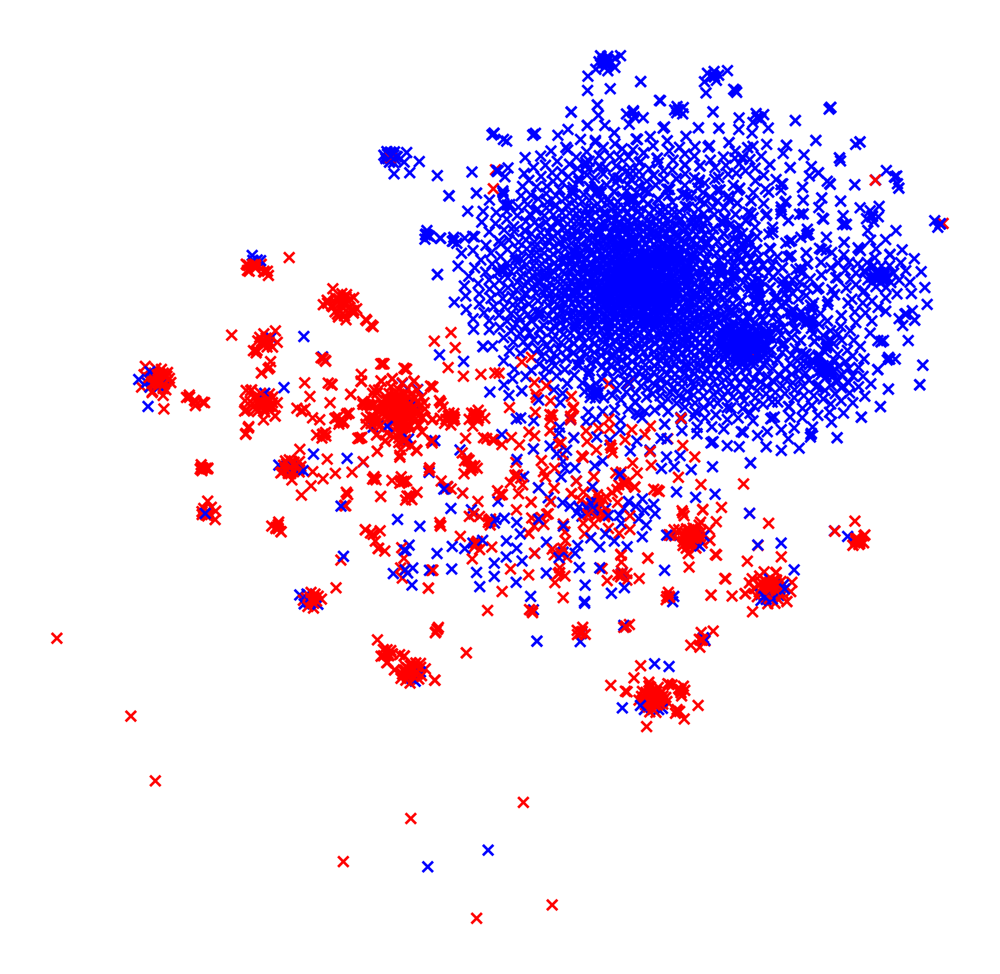

In [50]:
scatter_plot_doc_summary_vectors(dsvs_svm_lrp, svm_pred, lstm_tc.label_mapping[0], title='', save='./epi_svm_tc_lrp.png')

In [91]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 1)

0.9188459748720336

In [54]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 3)

0.9178687761749652

In [55]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 5)

0.9100511865984178

In [56]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 7)

0.9021405304792927

In [57]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 9)

0.9200093066542578

In [58]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 11)

0.9145649139134482

In [59]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 13)

0.9210795718939041

In [60]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 15)

0.9305258259655652

In [61]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 17)

0.9305258259655653

In [73]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 18)

0.9313634248487668

In [76]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 19)

0.9337831549557933

In [70]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 20)

0.9311307584923219

In [63]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 21)

0.9313168915774778

In [71]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 23)

0.932899022801303

In [72]:
knn_accuracy(dsvs_svm_lrp_sparse, svm_pred, 25)

0.9316891577477897

In [31]:
explain_lime = partial(svm_tc._explain_instance_lime, domain_mapping=False)
%time dsvs_svm_lime = generate_dsvs(X_sampled, partial(doc_summary_vector_svm, svm=svm_tc, explain=explain_lime))

CPU times: user 1h 23min 29s, sys: 49min 17s, total: 2h 12min 46s
Wall time: 56min 58s


In [28]:
dsvs_svm_lime_sparse = sparse.csr_matrix(dsvs_svm_lime)

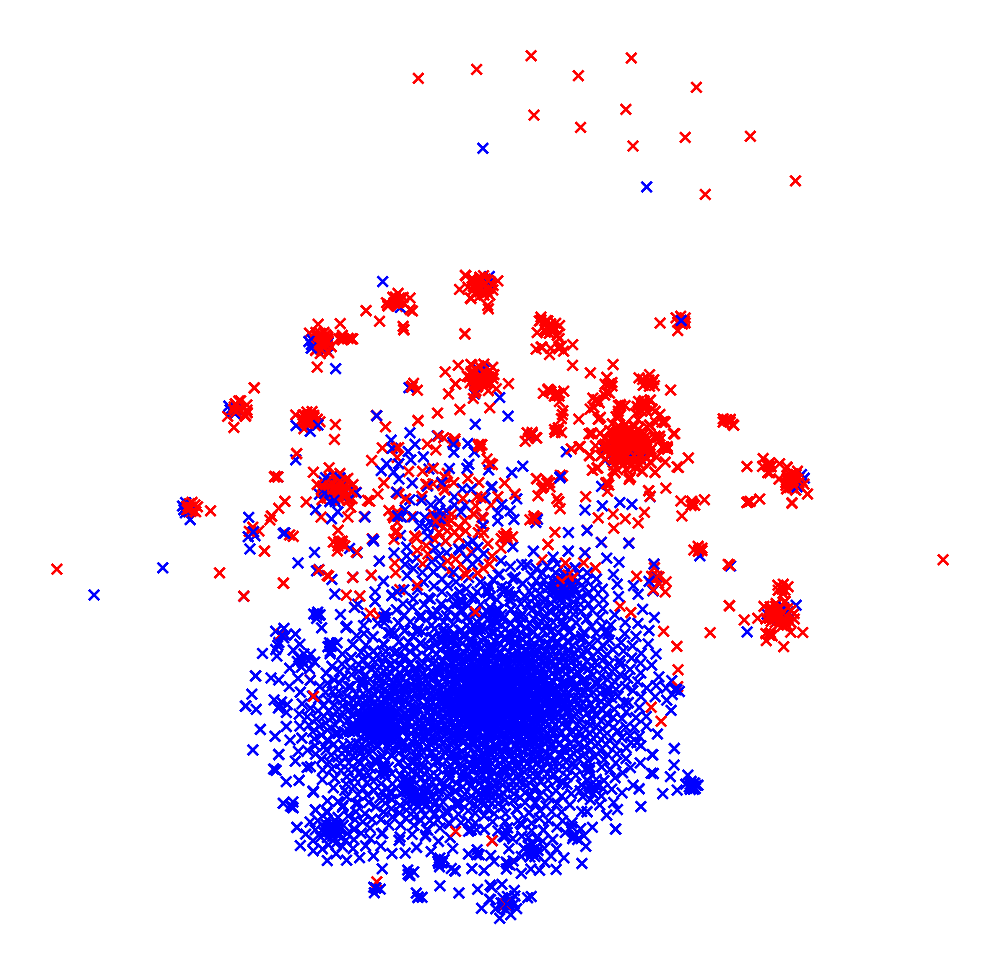

CPU times: user 1h 8min 40s, sys: 2.31 s, total: 1h 8min 43s
Wall time: 1h 8min 51s


In [47]:
%time scatter_plot_doc_summary_vectors(dsvs_svm_lime, svm_pred, lstm_tc.label_mapping[0], title='', save='./epi_svm_tc_lime.png')

In [33]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 1)

0.9102838529548627

In [34]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 3)

0.9108422522103303

In [35]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 5)

0.9095393206142394

In [36]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 7)

0.9178687761749652

In [29]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 9)

0.9178222429036762

In [30]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 11)

0.927826896230805

In [31]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 13)

0.928199162401117

In [32]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 15)

0.9262447650069798

In [37]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 17)

0.9311772917636111

In [38]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 19)

0.931363424848767

In [39]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 21)

0.9296882270823639

In [40]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 23)

0.9313634248487668

In [41]:
knn_accuracy(dsvs_svm_lime_sparse, svm_pred, 25)

0.9293624941833413

## Attention LSTM - EPI - NG

In [27]:
att_lstm_pred = att_lstm_tc.predict(X_sampled)[:,0]

In [28]:
%time dsvs_att_lstm = generate_dsvs(X_sampled, partial(doc_summary_vector_lstm, lstm=att_lstm_tc, explain=att_lstm_tc._explain))

CPU times: user 8min 33s, sys: 1min 50s, total: 10min 24s
Wall time: 2min 4s


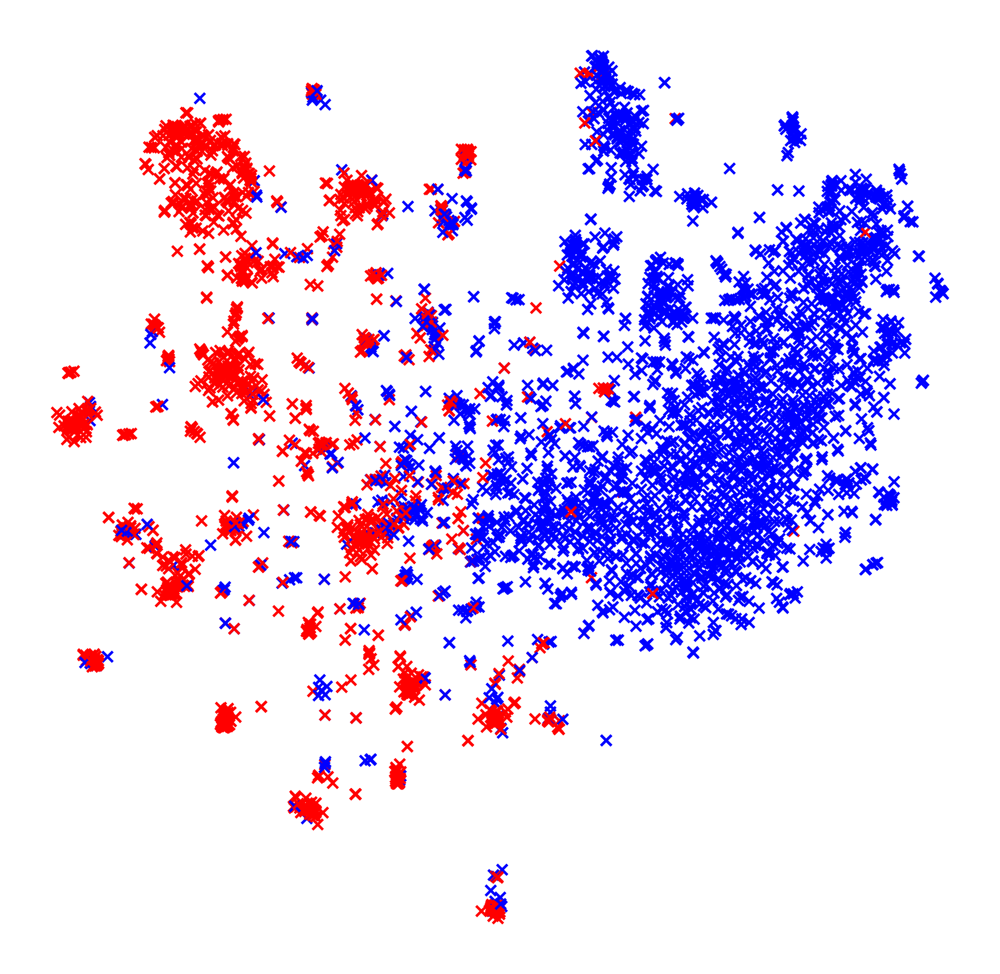

In [31]:
scatter_plot_doc_summary_vectors(dsvs_att_lstm, att_lstm_pred, lstm_tc.label_mapping[0], title='', save='./epi_att_lstm.png')

In [32]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 3)

0.9119590507212658

In [33]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 5)

0.9176361098185202

In [34]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 7)

0.9170777105630525

In [35]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 9)

0.9174965100046533

In [36]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 11)

0.9203815728245696

In [37]:
knn_accuracy(dsvs_att_lstm, att_lstm_pred, 13)

0.9186598417868777

## Naive Bayes - EPI - NG

In [92]:
naive_pred = naive_tc.predict(X_sampled)[:,0]

In [93]:
%time dsvs_naive = generate_dsvs(X_sampled, partial(doc_summary_vector_naive, naive=naive_tc))

CPU times: user 18min 13s, sys: 22min 40s, total: 40min 54s
Wall time: 5min 12s


In [96]:
dsvs_naive_sparse = sparse.csr_matrix(dsvs_naive)

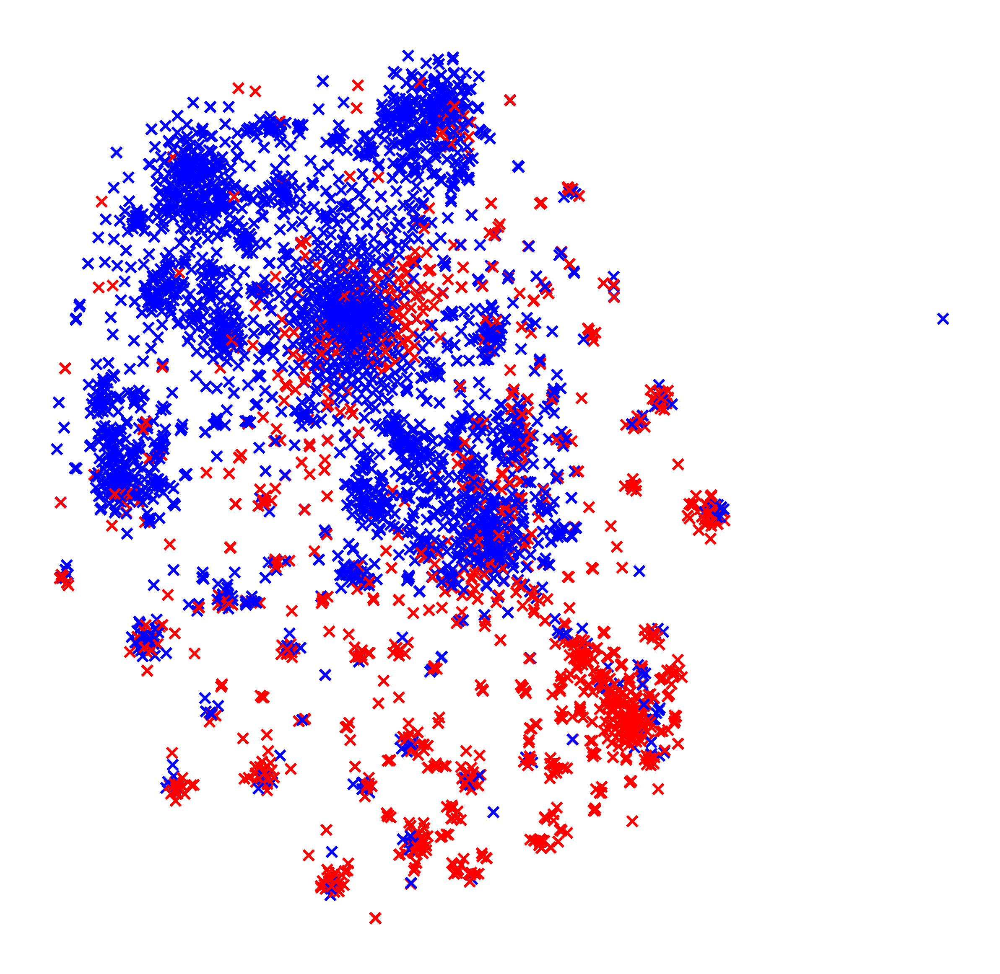

In [107]:
scatter_plot_doc_summary_vectors(dsvs_naive, naive_pred, lstm_tc.label_mapping[0], title='', save='./epi_naive.png')

In [97]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 1)

0.8087947882736157

In [98]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 3)

0.822940902745463

In [99]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 5)

0.8189855746859003

In [100]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 7)

0.8141461144718475

In [101]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 9)

0.8153559795253607

In [102]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 11)

0.8087482550023267

In [104]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 13)

0.8124709167054445

In [105]:
knn_accuracy(dsvs_naive_sparse, naive_pred, 15)

0.814797580269893

# Word Deletion

In [22]:
def get_truely_falsely_classified_indices(truth, pred):
    return np.argwhere(pred == truth)[:,0], np.argwhere(pred != truth)[:,0]

In [23]:
def prediction_without_relevant_words_lstm(x, lstm, explain, steps=10, label=0):
    word_vectors = lstm._word_vectors(lstm.preprocess_text(x))[0]
    unrelevant_words = np.where(~word_vectors.any(axis=1))[0]
    explanation = explain(x)[0]
    explanation[unrelevant_words] = -np.inf
    
    pred = np.zeros(steps, dtype='int')
    for i in range(steps):
        if i >= word_vectors.shape[0]:
            pred[i:] = pred[i]
            break
        probabilities = lstm.keras_model.predict(np.array([word_vectors]))
        if type(probabilities) == list:
            probabilities = probabilities[label]
        if probabilities.shape[1] == 1:
            pred[i] = probabilities.round().flatten().astype('int').item()
        else:
            pred[i] = np.argmax(probabilities, axis=1)[label].item()
        most_relevant_word_index = explanation.argmax()
        word_vectors[most_relevant_word_index] = 0
        explanation[most_relevant_word_index] = -np.inf
    return pred

def prediction_without_least_relevant_words_lstm(x, lstm, explain, steps=10, label=0):
    word_vectors = lstm._word_vectors(lstm.preprocess_text(x))[0]
    unrelevant_words = np.where(~word_vectors.any(axis=1))[0]
    explanation = explain(x)[0]
    explanation[unrelevant_words] = np.inf

    pred = np.zeros(steps, dtype='int')
    for i in range(steps):
        if i >= word_vectors.shape[0]:
            pred[i:] = pred[i]
            break

        probabilities = lstm.keras_model.predict(np.array([word_vectors]))
        if probabilities.shape[1] == 1:
            pred[i] = probabilities.round().flatten().astype('int').item()
        else:
            pred[i] = np.argmax(probabilities, axis=1)[label].item()
        least_relevant_word_index = explanation.argmin()
        word_vectors[least_relevant_word_index] = 0
        explanation[least_relevant_word_index] = np.inf
    return pred

def prediction_without_relevant_words_svm(x, svm, explain, steps=10, label=0):
    tfidf_vec = svm.tfidf_vectorizer.transform([x]).toarray()[0]
    num_relevant_words = tfidf_vec.nonzero()[0].shape[0]
    unrelevant_words = np.where(tfidf_vec == 0)[0]
    explanation = explain(x)[0]
    explanation[unrelevant_words] = -np.inf
    
    pred = np.zeros(steps, dtype='int')
    for i in range(steps):
        if i >= num_relevant_words:
            pred[i:] = pred[i]
            break
        pred[i] = svm.clf[label].predict([tfidf_vec]).item()
        most_relevant_word_index = explanation.argmax()
        tfidf_vec[most_relevant_word_index] = 0
        explanation[most_relevant_word_index] = -np.inf
    return pred

def prediction_without_least_relevant_words_svm(x, svm, explain, steps=10, label=0):
    tfidf_vec = svm.tfidf_vectorizer.transform([x]).toarray()[0]
    num_relevant_words = tfidf_vec.nonzero()[0].shape[0]
    voc = svm.tfidf_vectorizer.get_feature_names()
    unrelevant_words = np.where(tfidf_vec == 0)[0]
    explanation = explain(x)[0]
    explanation[unrelevant_words] = np.inf
    
    pred = np.zeros(steps, dtype='int')
    for i in range(steps):
        if i >= num_relevant_words:
            pred[i:] = pred[i]
            break
        pred[i] = svm.clf[label].predict([tfidf_vec]).item()
        least_relevant_word_index = explanation.argmin()
        tfidf_vec[least_relevant_word_index] = 0
        explanation[least_relevant_word_index] = np.inf
    return pred

def prediction_without_relevant_words_naive(x, naive, explain, steps=10, label=0):
    bow = naive.bow_vector(x)
    num_relevant_words = bow.nonzero()[0].shape[0]
    unrelevant_words = np.where(bow == 0)[0]
    explanation = explain(x)[0]
    explanation[unrelevant_words] = -np.inf
    
    pred = np.zeros(steps, dtype='int')
    for i in range(steps):
        if i >= num_relevant_words:
            pred[i:] = pred[i]
            break
        prod_conditionals = np.ma.log(naive.p_w_given_C[0].T * bow.T).filled(0).sum(axis=1) # prod P(w | C)
        weighted_by_class = np.log(naive.p_C[label]) + prod_conditionals
        pred[i] = weighted_by_class.argmax()
        most_relevant_word_index = explanation.argmax()
        bow[most_relevant_word_index] = 0
        explanation[most_relevant_word_index] = -np.inf
    return pred

def prediction_without_least_relevant_words_naive(x, naive, explain, steps=10, label=0):
    bow = naive.bow_vector(x)
    num_relevant_words = bow.nonzero()[0].shape[0]
    unrelevant_words = np.where(bow == 0)[0]
    explanation = explain(x)[0]
    explanation[unrelevant_words] = np.inf
    
    pred = np.zeros(steps, dtype='int')
    for i in range(steps):
        if i >= num_relevant_words:
            pred[i:] = pred[i]
            break
        prod_conditionals = np.ma.log(naive.p_w_given_C[0].T * bow.T).filled(0).sum(axis=1)
        weighted_by_class = np.log(naive.p_C[label]) + prod_conditionals
        pred[i] = weighted_by_class.argmax()
        most_relevant_word_index = explanation.argmin()
        bow[most_relevant_word_index] = 0
        explanation[most_relevant_word_index] = np.inf
    return pred


In [24]:
def word_deletion(X, y, prediction_without_relevant_words, steps=10):
    prediction_without_relevant_words = partial(prediction_without_relevant_words, steps=steps)
    predictions = np.zeros((steps, len(X)), dtype='int')
    for i,x in enumerate(X):
        predictions[:,i] = prediction_without_relevant_words(x)
    accuracies = []
    for predictions_at_step in predictions:
         accuracies.append(sklearn.metrics.accuracy_score(y, predictions_at_step))
    return accuracies

# 20 Newsgroups

In [26]:
STEPS = 20
LSTM_SAMPLE_SIZE = 5000
SVM_SAMPLE_SIZE = 1000
LSTM_KERNEL_WIDTH = 10
SVM_KERNEL_WIDTH = 10
LIMIT = 8000
LABEL = 0
EPS = 0.001
BIAS_FACTOR = 1.0

## LSTM

In [26]:
lstm_ng_predictions = lstm_ng.predict(X_ng_test)[:,LABEL]

In [27]:
lstm_ng_true, lstm_ng_false = get_truely_falsely_classified_indices(y_ng_test, lstm_ng_predictions)

### LRP

In [56]:
lstm_explain_lrp = partial(lstm_ng._explain_instance_lrp, domain_mapping=False, eps=EPS, bias_factor=BIAS_FACTOR)

In [29]:
word_deletion_lstm_ng_lrp = partial(prediction_without_relevant_words_lstm, lstm = lstm_ng, explain=lstm_explain_lrp, label=LABEL)

In [32]:
%time dropping_accuracy_lstm_ng_lrp = word_deletion(X_ng_test[lstm_ng_true][:LIMIT], y_ng_test[lstm_ng_true][:LIMIT], word_deletion_lstm_ng_lrp, steps=STEPS)

CPU times: user 4h 27min 19s, sys: 2h 12min 44s, total: 6h 40min 3s
Wall time: 1h 11min 47s


In [33]:
dropping_accuracy_lstm_ng_lrp

[1.0,
 0.8704931620389557,
 0.7805636137588065,
 0.7140489017820141,
 0.6628677994198093,
 0.6129299627020307,
 0.5733526730211355,
 0.5428926647326979,
 0.5153336096145876,
 0.4879817654372151,
 0.4622876087857439,
 0.4409448818897638,
 0.4235391628677994,
 0.4040613344384584,
 0.39059262329050976,
 0.3738085370907584,
 0.3603398259428098,
 0.34852880232076255,
 0.33547451305428927,
 0.3276004973062578]

### LIME

In [35]:
lstm_explain_lime = partial(lstm_ng._explain_instance_lime, domain_mapping=False, sample_size=LSTM_SAMPLE_SIZE, kernel_width=LSTM_KERNEL_WIDTH, distance_metric='cosine')

In [36]:
word_deletion_lstm_ng_lime = partial(prediction_without_relevant_words_lstm, lstm = lstm_ng, explain=lstm_explain_lime, label=LABEL)

In [37]:
%time dropping_accuracy_lstm_ng_lime = word_deletion(X_ng_test[lstm_ng_true][:LIMIT], y_ng_test[lstm_ng_true][:LIMIT], word_deletion_lstm_ng_lime, steps=STEPS)

CPU times: user 2d 9h 12min 29s, sys: 5h 2min 45s, total: 2d 14h 15min 14s
Wall time: 15h 59min 1s


In [38]:
dropping_accuracy_lstm_ng_lime

[1.0,
 0.7946539577289681,
 0.661831744716121,
 0.5565685868213842,
 0.48383754662246165,
 0.4254040613344385,
 0.3843762950683796,
 0.34749274761707416,
 0.3251139660174057,
 0.3025279734769996,
 0.2836717778698715,
 0.26978864484044757,
 0.260049730625777,
 0.24906755076668047,
 0.24140074595938665,
 0.2318690426854538,
 0.22295897223373395,
 0.21985080812266888,
 0.21218400331537504,
 0.20493162038955656]

## SVM

In [37]:
svm_ng_predictions = svm_ng.predict(X_ng_test)[:,LABEL]

In [38]:
svm_ng_true, svm_ng_false = get_truely_falsely_classified_indices(y_ng_test, svm_ng_predictions)

### LRP

In [14]:
svm_explain_lrp = partial(svm_ng.explain, method='lrp', domain_mapping=False, options={'eps':EPS, 'bias_factor':BIAS_FACTOR})

In [15]:
word_deletion_svm_ng_lrp = partial(prediction_without_relevant_words_svm, svm = svm_ng, explain=svm_explain_lrp, label=LABEL)

In [16]:
dropping_accuracy_svm_ng_lrp = word_deletion(X_ng_test[svm_ng_true][:LIMIT], y_ng_test[svm_ng_true][:LIMIT], word_deletion_svm_ng_lrp, steps=STEPS)

In [17]:
dropping_accuracy_svm_ng_lrp

[0.9990085922009253,
 0.8464970257766028,
 0.7285194976867151,
 0.6283873099801719,
 0.5517184401850628,
 0.478354263053536,
 0.4140779907468605,
 0.361202908129544,
 0.30915399867812293,
 0.2604097818902842,
 0.22141440846001323,
 0.19365499008592202,
 0.1670522141440846,
 0.14077990746860541,
 0.12177792465300727,
 0.10723727693324521,
 0.0922009253139458,
 0.07815598149372108,
 0.06774619960343688,
 0.057666886979510903]

### LIME

In [39]:
svm_explain_lime = partial(svm_ng.explain, method='lime', domain_mapping=False, options={'sample_size': SVM_SAMPLE_SIZE, 'kernel_width': SVM_KERNEL_WIDTH, 'distance_metric':'cosine'})

In [40]:
word_deletion_svm_ng_lime = partial(prediction_without_relevant_words_svm, svm = svm_ng, explain=svm_explain_lime, label=LABEL)

In [41]:
dropping_accuracy_svm_ng_lime = word_deletion(X_ng_test[svm_ng_true][:LIMIT], y_ng_test[svm_ng_true][:LIMIT], word_deletion_svm_ng_lime, steps=STEPS)

In [42]:
dropping_accuracy_svm_ng_lime

[0.9990085922009253,
 0.8478189028420356,
 0.731163251817581,
 0.6351619299405156,
 0.5641110376734964,
 0.49983476536682087,
 0.4411764705882353,
 0.3884666226040978,
 0.3451751487111699,
 0.306345009914078,
 0.27081956378056843,
 0.24058162590879048,
 0.21530072703238598,
 0.19563780568407138,
 0.176305353602115,
 0.1622604097818903,
 0.14970257766027759,
 0.13681427627230666,
 0.12590879048248513,
 0.1140118968935889]

## Naive Bayes

In [30]:
naive_ng_predictions = naive_ng.predict(X_ng_test)[:,LABEL]

In [31]:
naive_ng_true, naive_ng_false = get_truely_falsely_classified_indices(y_ng_test, naive_ng_predictions)

In [32]:
naive_explain = naive_ng._explain

In [33]:
word_deletion_naive_ng = partial(prediction_without_relevant_words_naive, naive=naive_ng, explain=naive_explain, label=LABEL)

In [34]:
dropping_accuracy_naive_ng = word_deletion(X_ng_test[naive_ng_true][:LIMIT], y_ng_test[naive_ng_true][:LIMIT], word_deletion_naive_ng, steps=STEPS)

In [35]:
dropping_accuracy_naive_ng

[1.0,
 0.9144927536231884,
 0.8460144927536232,
 0.779891304347826,
 0.7213768115942029,
 0.6643115942028985,
 0.615036231884058,
 0.567572463768116,
 0.525,
 0.48333333333333334,
 0.44655797101449274,
 0.41394927536231885,
 0.38460144927536233,
 0.35778985507246375,
 0.33442028985507244,
 0.3130434782608696,
 0.2922101449275362,
 0.2710144927536232,
 0.2534420289855073,
 0.23623188405797102]

## Attention LSTM

In [22]:
att_lstm_ng_predictions = att_lstm_ng.predict(X_ng_test)[:,LABEL]

In [23]:
att_lstm_ng_true, att_lstm_ng_false = get_truely_falsely_classified_indices(y_ng_test, att_lstm_ng_predictions)

In [24]:
att_lstm_explain = att_lstm_ng._explain

In [25]:
word_deletion_att_lstm_ng = partial(prediction_without_relevant_words_lstm, lstm=att_lstm_ng, explain=att_lstm_explain, label=LABEL)

In [27]:
dropping_accuracy_att_lstm_ng = word_deletion(X_ng_test[att_lstm_ng_true][:LIMIT], y_ng_test[att_lstm_ng_true][:LIMIT], word_deletion_att_lstm_ng, steps=STEPS)

In [28]:
dropping_accuracy_att_lstm_ng

[1.0,
 0.8102665350444225,
 0.7405725567620928,
 0.6880552813425469,
 0.6396841066140178,
 0.6090819348469891,
 0.5786771964461994,
 0.5516288252714708,
 0.5261599210266535,
 0.5097729516288253,
 0.4835143139190523,
 0.46614017769002963,
 0.4442250740375123,
 0.4278381046396841,
 0.4102665350444225,
 0.39447186574531096,
 0.3800592300098717,
 0.36189536031589337,
 0.35320829220138206,
 0.3455083909180652]

----


----



# Toxic Comments - Word Deletion

In [11]:
STEPS = 20
LSTM_SAMPLE_SIZE = 3000
SVM_SAMPLE_SIZE = 1000
LSTM_KERNEL_WIDTH = 10
SVM_KERNEL_WIDTH = 10
LIMIT = 30000
LABEL = 0
EPS = 0.001
BIAS_FACTOR = 1.0

## LSTM

In [12]:
lstm_tc_predictions = lstm_tc.predict(X_tc_test)[:,LABEL]

In [13]:
lstm_tc_true, lstm_tc_false = get_truely_falsely_classified_indices(y_tc_test[:,LABEL], lstm_tc_predictions)

### LRP

In [14]:
lstm_explain_lrp = partial(lstm_tc.explain, method='lrp', domain_mapping=False, options={'eps': EPS, 'bias_factor': BIAS_FACTOR})

In [15]:
word_deletion_lstm_tc_lrp = partial(prediction_without_relevant_words_lstm, lstm = lstm_tc, explain=lstm_explain_lrp, label=LABEL)

In [19]:
%time dropping_accuracy_lstm_tc_lrp = word_deletion(X_tc_test[lstm_tc_true][:LIMIT], y_tc_test[lstm_tc_true][:,LABEL][:LIMIT], word_deletion_lstm_tc_lrp, steps=STEPS)

CPU times: user 45min 39s, sys: 25min 50s, total: 1h 11min 29s
Wall time: 11min 56s


In [20]:
dropping_accuracy_lstm_tc_lrp

[1.0,
 0.5585760517799353,
 0.3372168284789644,
 0.22653721682847897,
 0.16116504854368932,
 0.1145631067961165,
 0.09190938511326861,
 0.07313915857605179,
 0.0634304207119741,
 0.05760517799352751,
 0.05372168284789644,
 0.0511326860841424,
 0.045307443365695796,
 0.042071197411003236,
 0.040129449838187704,
 0.038834951456310676,
 0.037540453074433655,
 0.03495145631067961,
 0.03300970873786408,
 0.032362459546925564]

### LIME

In [22]:
lstm_explain_lime = partial(lstm_tc.explain, method='lime', domain_mapping=False, options={'sample_size': LSTM_SAMPLE_SIZE, 'kernel_width':LSTM_KERNEL_WIDTH, 'distance_metric': 'cosine'})

In [23]:
word_deletion_lstm_tc_lime = partial(prediction_without_relevant_words_lstm, lstm = lstm_tc, explain=lstm_explain_lime, label=LABEL)

In [24]:
%time dropping_accuracy_lstm_tc_lime = word_deletion(X_tc_test[lstm_tc_true][:LIMIT], y_tc_test[lstm_tc_true][:,LABEL][:LIMIT], word_deletion_lstm_tc_lime, steps=STEPS)

CPU times: user 5h 34min 52s, sys: 44min 20s, total: 6h 19min 12s
Wall time: 1h 26min 1s


In [25]:
dropping_accuracy_lstm_tc_lime

[1.0,
 0.541747572815534,
 0.32168284789644014,
 0.2051779935275081,
 0.14563106796116504,
 0.1080906148867314,
 0.09579288025889968,
 0.07572815533980583,
 0.0627831715210356,
 0.05825242718446602,
 0.05372168284789644,
 0.05307443365695793,
 0.05048543689320388,
 0.04660194174757282,
 0.045307443365695796,
 0.04724919093851133,
 0.045307443365695796,
 0.04401294498381877,
 0.04271844660194175,
 0.045307443365695796]

## SVM

In [27]:
svm_tc_predictions = svm_tc.predict(X_tc_test)[:,LABEL]

In [28]:
svm_tc_true, svm_tc_false = get_truely_falsely_classified_indices(y_tc_test[:,LABEL], svm_tc_predictions)

### LRP

In [29]:
svm_explain_lrp = partial(svm_tc.explain, domain_mapping=False, options={'eps': EPS, 'bias_factor': BIAS_FACTOR})

In [30]:
word_deletion_svm_tc_lrp = partial(prediction_without_relevant_words_svm, svm = svm_tc, explain=svm_explain_lrp, label=LABEL)

In [31]:
%time dropping_accuracy_svm_tc_lrp = word_deletion(X_tc_test[svm_tc_true][:LIMIT], y_tc_test[svm_tc_true][:,LABEL][:LIMIT], word_deletion_svm_tc_lrp, steps=STEPS)

CPU times: user 2min 8s, sys: 2min 42s, total: 4min 51s
Wall time: 37.3 s


In [32]:
dropping_accuracy_svm_tc_lrp

[1.0,
 0.39562764456981664,
 0.17912552891396333,
 0.07898448519040903,
 0.039492242595204514,
 0.020451339915373765,
 0.010578279266572637,
 0.004231311706629055,
 0.0028208744710860366,
 0.0021156558533145277,
 0.0007052186177715092,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

### LIME

In [34]:
svm_explain_lime = partial(svm_tc.explain, method='lime', domain_mapping=False, options={'sample_size': LSTM_SAMPLE_SIZE, 'kernel_width':LSTM_KERNEL_WIDTH, 'distance_metric': 'cosine'})

In [35]:
word_deletion_svm_tc_lime = partial(prediction_without_relevant_words_svm, svm = svm_tc, explain=svm_explain_lime, label=LABEL)

In [36]:
%time dropping_accuracy_svm_tc_lime = word_deletion(X_tc_test[svm_tc_true][:LIMIT], y_tc_test[svm_tc_true][:,LABEL][:LIMIT], word_deletion_svm_tc_lime, steps=STEPS)

CPU times: user 1h 5min 6s, sys: 18min 27s, total: 1h 23min 34s
Wall time: 55min 1s


In [37]:
dropping_accuracy_svm_tc_lime

[1.0,
 0.40620592383638926,
 0.18829337094499296,
 0.09520451339915374,
 0.05077574047954866,
 0.029619181946403384,
 0.021861777150916785,
 0.011283497884344146,
 0.00846262341325811,
 0.006346967559943582,
 0.004936530324400564,
 0.004936530324400564,
 0.004936530324400564,
 0.004231311706629055,
 0.0021156558533145277,
 0.0021156558533145277,
 0.0021156558533145277,
 0.0021156558533145277,
 0.0014104372355430183,
 0.0014104372355430183]

## Naive Bayes

In [39]:
naive_tc_predictions = naive_tc.predict(X_tc_test)[:,LABEL]

In [40]:
naive_tc_true, naive_tc_false = get_truely_falsely_classified_indices(y_tc_test[:,LABEL], naive_tc_predictions)

In [41]:
naive_explain = naive_tc._explain

In [42]:
word_deletion_naive_tc = partial(prediction_without_relevant_words_naive, naive=naive_tc, explain=naive_explain, label=LABEL)

In [43]:
%time dropping_accuracy_naive_tc = word_deletion(X_tc_test[naive_tc_true][:LIMIT], y_tc_test[naive_tc_true][:,LABEL][:LIMIT], word_deletion_naive_tc, steps=STEPS)

CPU times: user 2min 28s, sys: 0 ns, total: 2min 28s
Wall time: 2min 29s


In [44]:
dropping_accuracy_naive_tc

[1.0,
 0.6190823015294975,
 0.3889293517844137,
 0.25491624180626365,
 0.15877640203932994,
 0.09322651128914786,
 0.05826656955571741,
 0.04005826656955572,
 0.02986161689730517,
 0.02039329934450109,
 0.01529497450837582,
 0.010924981791697014,
 0.010196649672250545,
 0.007283321194464676,
 0.0065549890750182084,
 0.005826656955571741,
 0.005098324836125273,
 0.004369992716678805,
 0.0029133284777858705,
 0.0021849963583394027]

## Attention LSTM

In [46]:
att_lstm_tc_predictions = att_lstm_tc.predict(X_tc_test)[:,LABEL]

In [47]:
att_lstm_tc_true, att_lstm_tc_false = get_truely_falsely_classified_indices(y_tc_test[:,LABEL], att_lstm_tc_predictions)

In [48]:
att_lstm_explain = att_lstm_tc._explain

In [49]:
word_deletion_att_lstm_tc = partial(prediction_without_relevant_words_lstm, lstm=att_lstm_tc, explain=att_lstm_explain, label=LABEL)

In [51]:
%time dropping_accuracy_att_lstm_tc = word_deletion(X_tc_test[att_lstm_tc_true][:LIMIT], y_tc_test[att_lstm_tc_true][:,LABEL][:LIMIT], word_deletion_att_lstm_tc, steps=STEPS)

CPU times: user 31min 41s, sys: 6min 48s, total: 38min 30s
Wall time: 6min 47s


In [52]:
dropping_accuracy_att_lstm_tc

[1.0,
 0.5116588940706196,
 0.2864756828780813,
 0.19187208527648233,
 0.1312458361092605,
 0.09260493004663557,
 0.072618254497002,
 0.06462358427714857,
 0.05463024650233178,
 0.049966688874083946,
 0.046635576282478344,
 0.04263824117255163,
 0.03930712858094604,
 0.0379746835443038,
 0.03530979347101932,
 0.033311125916055964,
 0.030646235842771485,
 0.029980013324450366,
 0.029980013324450366,
 0.029313790806129246]

---
---



----

----